In [1]:
# Mounting your Google Drive is optional, and you could also simply copy and
# upload the data to your colab instance. This manula upload is also easy to do, 
# but you will have to figure out how to do it.
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [2]:
import os
if not os.path.exists("/content/gdrive/My Drive/Colab Notebooks/CS_543_MP4"):
    os.makedirs("/content/gdrive/My Drive/Colab Notebooks/CS_543_MP4")
os.chdir("/content/gdrive/My Drive/Colab Notebooks/CS_543_MP4")

In [3]:
# download dataset
!wget https://drive.switch.ch/index.php/s/UG0ZlZXY47LKSaW/download
!unzip download
!rm download
%cd data
!unzip -qqo albertville_rgb.zip
!unzip -qqo albertville_normal.zip
!unzip -qqo albertville_principal_curvature.zip
!unzip -qqo almena_rgb.zip
!unzip -qqo almena_normal.zip
!unzip -qqo almena_principal_curvature.zip
!rm albertville_rgb.zip albertville_normal.zip albertville_principal_curvature.zip almena_rgb.zip almena_normal.zip almena_principal_curvature.zip
%cd ..

--2021-04-27 15:18:27--  https://drive.switch.ch/index.php/s/UG0ZlZXY47LKSaW/download
Resolving drive.switch.ch (drive.switch.ch)... 86.119.34.138, 86.119.34.137, 2001:620:5ca1:1ee::11, ...
Connecting to drive.switch.ch (drive.switch.ch)|86.119.34.138|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘download’

download                [            <=>     ] 387.57M  10.9MB/s    in 38s     

2021-04-27 15:19:07 (10.3 MB/s) - ‘download’ saved [406396331]

Archive:  download
 extracting: data/albertville_normal.zip  
 extracting: data/albertville_principal_curvature.zip  
 extracting: data/albertville_rgb.zip  
 extracting: data/almena_normal.zip  
 extracting: data/almena_principal_curvature.zip  
 extracting: data/almena_rgb.zip     
/content/gdrive/My Drive/Colab Notebooks/CS_543_MP4/data
/content/gdrive/My Drive/Colab Notebooks/CS_543_MP4


In [8]:
import glob
import os
import numpy as np
import random
import time
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt

import cv2
from PIL import Image
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils import data
from torchvision import models
from torchvision.transforms import ToTensor, Normalize

In [9]:
# global variable
device = torch.device("cuda:0")

In [10]:
#additional block 
def angle_error(prediction, target):
    prediction_error = torch.cosine_similarity(prediction, target)
    prediction_error = torch.clamp(prediction_error, min=-1.0, max=1.0)
    prediction_error = torch.acos(prediction_error) * 180.0 / np.pi
    return prediction_error

def simple_predict(split, model):
    model.eval()
    dataset = NormalDataset(split=split)
    dataloader = data.DataLoader(dataset, batch_size=1, shuffle=False, 
                                 num_workers=2, drop_last=False)
    gts, preds, losses = [], [], []
    total_normal_errors = None
    with torch.no_grad():
        for i, batch in enumerate(tqdm(dataloader)):
            img, gt, mask = batch
            img = img.to(device)
            gt = gt.to(device)
            mask = mask.to(device)

            pred = model(img)
            loss = (F.l1_loss(pred, gt, reduction="none") * mask).mean()

            gts.append((gt[0].permute((1, 2, 0)).cpu().numpy() + 1) / 2)
            preds.append((pred[0].permute((1, 2, 0)).cpu().numpy() + 1) / 2)
            losses.append(loss.item())

            angle_error_prediction = angle_error(pred, gt)
            angle_error_prediction = angle_error_prediction[mask > 0].view(-1)
            if total_normal_errors is None:
                total_normal_errors = angle_error_prediction.cpu().numpy()
            else:
                total_normal_errors = np.concatenate(
                    (total_normal_errors, angle_error_prediction.cpu().numpy())
                )

    return gts, preds, losses, total_normal_errors

class VisualizationDataset(data.Dataset):
    def __init__(self, image_dir="./data/normal_visualization/image", image_ext=".png"):
        self.img_dir = image_dir
        self.img_ext = image_ext
        
        self.image_filenames = [
            os.path.splitext(os.path.basename(l))[0] for l in glob.glob(self.img_dir + "/*" + image_ext)
        ]

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, index):
        filename = self.image_filenames[index]
        img = Image.open(os.path.join(self.img_dir, filename) + self.img_ext)
        img = np.asarray(img).copy()
        img = ToTensor()(img)
        img = Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(img)
        
        return img.contiguous(), filename

def simple_vis(model):
    model.eval()
    dataset = VisualizationDataset(image_dir="./data/normal_visualization/images")
    dataloader = data.DataLoader(dataset, batch_size=1, shuffle=False, 
                                 num_workers=2, drop_last=False)
    imgs, preds = [], []

    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    with torch.no_grad():
        for i, batch in enumerate(tqdm(dataloader)):
            img, _ = batch
            img = img.to(device)

            pred = model(img)
            imgs.append(
                std * img[0].permute((1, 2, 0)).cpu().numpy() + mean
            )
            preds.append((pred[0].permute((1, 2, 0)).cpu().numpy() + 1) / 2)

    return imgs, preds

from PIL import Image

def simple_test(model, out_dir):
    model.eval()
    dataset = VisualizationDataset(image_dir="./data/Q2_test_data")
    dataloader = data.DataLoader(dataset, batch_size=1, shuffle=False, 
                                 num_workers=2, drop_last=False)

    with torch.no_grad():
        for i, batch in enumerate(tqdm(dataloader)):
            img, filename = batch
            img = img.to(device)

            pred = model(img)
            pred = ((pred[0].permute((1, 2, 0)).cpu().numpy() + 1) / 2) * 255
            pred = pred.astype(np.uint8)

            output = os.path.join(out_dir, filename[0] + ".png")

            Image.fromarray(pred).save(output)

#additional block 

In [11]:
class NormalDataset(data.Dataset):
    """
    Data loader for the Suface Normal Dataset. If data loading is a bottleneck, 
    you may want to optimize this in for faster training. Possibilities include
    pre-loading all images and annotations into memory before training, so as 
    to limit delays due to disk reads.
    """
    def __init__(self, split="train", data_dir="./data"):
        assert(split in ["train", "val"])
        split2name = {
            "train": "almena",
            "val": "albertville",
        }
        self.img_dir = os.path.join(data_dir, split2name[split] + "_rgb", "rgb")
        self.gt_dir = os.path.join(data_dir, split2name[split] + "_normal", "normal")
        
        self.split = split
        self.filenames = [
            os.path.splitext(os.path.basename(l))[0] for l in glob.glob(self.img_dir + "/*.png")
        ]

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, index):
        filename = self.filenames[index]
        img = Image.open(os.path.join(self.img_dir, filename) + ".png")
        img = np.asarray(img).copy()
        gt = Image.open(os.path.join(self.gt_dir, filename.replace("_rgb", "_normal")) + ".png")
        gt = np.asarray(gt)

        # from rgb image to surface normal
        gt = gt.astype(np.float32) / 255
        gt = torch.Tensor(np.asarray(gt).copy()).permute((2, 0, 1))
        mask = self.build_mask(gt).to(torch.float)

        img = ToTensor()(img)
        img = Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(img)

        # normalize gt
        gt = gt * 2 - 1
        
        return img.contiguous(), gt, mask.sum(dim=0) > 0

    @staticmethod
    def build_mask(target, val=0.502, tol=1e-3):
        target = target.unsqueeze(0)
        if target.shape[1] == 1:
            mask = ((target >= val - tol) & (target <= val + tol))
            mask = F.conv2d(mask.float(), torch.ones(1, 1, 5, 5, device=mask.device), padding=2) != 0
            return (~mask).expand_as(target).squeeze(0)

        mask1 = (target[:, 0, :, :] >= val - tol) & (target[:, 0, :, :] <= val + tol)
        mask2 = (target[:, 1, :, :] >= val - tol) & (target[:, 1, :, :] <= val + tol)
        mask3 = (target[:, 2, :, :] >= val - tol) & (target[:, 2, :, :] <= val + tol)
        mask = (mask1 & mask2 & mask3).unsqueeze(1)
        mask = F.conv2d(mask.float(), torch.ones(1, 1, 5, 5, device=mask.device), padding=2) != 0
        return (~mask).expand_as(target).squeeze(0)

In [21]:
##########
#TODO: design your own network here. The expectation is to write from scratch. But it's okay to get some inspiration 
#from conference paper. The bottom line is that you will not just copy code from other repo
##########

class MyModel(nn.Module):

    def __init__(self): # feel free to modify input paramters
        super(MyModel, self).__init__()
        # pass
        #part 2
        # res18 = models.resnet18(pretrained=True)  
        # self.layers = list(res18.children())[:-2]
        # self.layers.append(torch.nn.Conv2d(512,256,1,stride = 1, padding = 0))
        # self.layers.append(torch.nn.BatchNorm2d(256))
        # self.layers.append(torch.nn.ReLU(inplace=True))
        # self.layers.append(torch.nn.Conv2d(256,128,1,stride = 1, padding = 0))
        # self.layers.append(torch.nn.BatchNorm2d(128))
        # self.layers.append(torch.nn.ReLU(inplace=True))
        # self.layers.append(torch.nn.Conv2d(128,64,1,stride = 1, padding = 0))
        # self.layers.append(torch.nn.BatchNorm2d(64))
        # self.layers.append(torch.nn.ReLU(inplace=True))
        # self.layers.append(torch.nn.Conv2d(64,3,1,stride = 1, padding = 0))
        # self.layers.append(torch.nn.Upsample((512,512), mode = 'bilinear'))
        # self.layers = torch.nn.ModuleList(self.layers)

        #part3
        # res18 = models.resnet18(pretrained=True)  
        # self.layers = list(res18.children())[:-2]
        # self.conv0 = torch.nn.Conv2d(512,256,1,stride = 1, padding = 0)
        # self.upsample0 = torch.nn.Upsample(scale_factor=2, mode = 'bilinear')
        # self.conv1 = torch.nn.Conv2d(256,128,1,stride = 1, padding = 0)
        # self.upsample1 = torch.nn.Upsample(scale_factor=2, mode = 'bilinear')
        # self.conv2 = torch.nn.Conv2d(128,64,1,stride = 1, padding = 0)
        # self.upsample2 = torch.nn.Upsample(scale_factor=2, mode = 'bilinear')
        # self.conv3 = torch.nn.Conv2d(64,32,1,stride = 1, padding = 0)
        # self.upsample3 = torch.nn.Upsample(scale_factor=2, mode = 'bilinear')
        # self.conv3 = torch.nn.Conv2d(32,3,1,stride = 1, padding = 0)
        # self.upsample = torch.nn.Upsample(scale_factor=2, mode = 'bilinear')
        # self.layers = torch.nn.ModuleList(self.layers)


        res18 = models.resnet18(pretrained=True)  
        self.layers = list(res18.children())[:-2]
        self.layers.append(torch.nn.Conv2d(512,256,1,stride = 1, padding = 0))
        # self.layers.append(torch.nn.BatchNorm2d(256))
        self.layers.append(torch.nn.Upsample(scale_factor=2, mode = 'bilinear'))
        self.layers.append(torch.nn.ReLU(inplace=True))
        self.layers.append(torch.nn.Conv2d(256,128,1,stride = 1, padding = 0))
        self.layers.append(torch.nn.BatchNorm2d(128))
        self.layers.append(torch.nn.Upsample(scale_factor=2, mode = 'bilinear'))
        self.layers.append(torch.nn.ReLU(inplace=True))
        self.layers.append(torch.nn.Conv2d(128,64,1,stride = 1, padding = 0))
        # self.layers.append(torch.nn.BatchNorm2d(64))
        self.layers.append(torch.nn.Upsample(scale_factor=2, mode = 'bilinear'))
        self.layers.append(torch.nn.ReLU(inplace=True))
        self.layers.append(torch.nn.BatchNorm2d(64))
        self.layers.append(torch.nn.Conv2d(64,32,1,stride = 1, padding = 0))
        self.layers.append(torch.nn.BatchNorm2d(32))
        self.layers.append(torch.nn.Upsample(scale_factor=2, mode = 'bilinear'))
        self.layers.append(torch.nn.ReLU(inplace=True))
        # self.layers.append(torch.nn.MaxPool2d(2, 2))
        self.layers.append(torch.nn.Conv2d(32,16,1,stride = 1, padding = 0))
        self.layers.append(torch.nn.ReLU(inplace=True))
        self.layers.append(torch.nn.Conv2d(16,3,1,stride = 1, padding = 0))
        
        self.layers.append(torch.nn.Upsample(scale_factor=2, mode = 'bilinear'))
        self.layers = torch.nn.ModuleList(self.layers)

        # res18 = models.resnet18(pretrained=True)  
        # self.layers = list(res18.children())[:-2]

        # self.conv512 = torch.nn.Conv2d(512,512,1,stride = 1, padding = 0)
        # self.conv256 = torch.nn.Conv2d(256,256,1,stride = 1, padding = 0)
        # self.conv128 = torch.nn.Conv2d(128,128,1,stride = 1, padding = 0)
        # self.conv64 = torch.nn.Conv2d(64,64,1,stride = 1, padding = 0)
        # self.conv32 = torch.nn.Conv2d(32,32,1,stride = 1, padding = 0)
        # self.conv16 = torch.nn.Conv2d(16,16,1,stride = 1, padding = 0)


        # self.conv0 = torch.nn.Conv2d(512,256,1,stride = 1, padding = 0)
        # self.conv1 = torch.nn.Conv2d(256,128,1,stride = 1, padding = 0)
        # self.conv2 = torch.nn.Conv2d(128,64,1,stride = 1, padding = 0)
        # self.conv3 = torch.nn.Conv2d(64,32,1,stride = 1, padding = 0)
        # self.conv4 = torch.nn.Conv2d(32,3,1,stride = 1, padding = 0)
        # # self.conv5 = torch.nn.Conv2d(16,3,1,stride = 1, padding = 0)

        # self.bn0 = torch.nn.BatchNorm2d(256)
        # self.bn1 = torch.nn.BatchNorm2d(128)
        # self.bn2 = torch.nn.BatchNorm2d(64)
        # self.bn3 = torch.nn.BatchNorm2d(32)
 


        # self.upsample = torch.nn.Upsample(scale_factor=2, mode = 'bilinear')
        # self.layers = torch.nn.ModuleList(self.layers)
        # self.relu = torch.nn.ReLU(inplace=True)
 

    def forward(self, x): #*params): # feel free to modify input paramters
      #part2
        for l in self.layers:
          x = l(x)
        
        return x

        # for l in self.layers:
        #   x = l(x)
 
        # tempx = F.relu(self.conv512(x))
        # tempx = F.relu(self.conv0(tempx))  
        # x = F.relu(self.conv0(x))
        # x = torch.cat([x, tempx], dim=1)
        # x = F.relu(self.conv0(x))
        # x = self.upsample(x)


        # tempx = F.relu(self.conv256(x))
        # tempx = F.relu(self.conv1(tempx))  
        # x = F.relu(self.conv1(x))
        # x = torch.cat([x, tempx], dim=1)
        # x = F.relu(self.conv1(x))
        # x = self.upsample(x)



        # tempx = F.relu(self.conv128(x))
        # tempx = F.relu(self.conv2(tempx))  
        # x = F.relu(self.conv2(x))
        # x = torch.cat([x, tempx], dim=1)
        # x = F.relu(self.conv2(x))
        # x = self.upsample(x)



        # tempx = F.relu(self.conv64(x))
        # tempx = F.relu(self.conv3(tempx))  
        # x = F.relu(self.conv3(x))
        # x = torch.cat([x, tempx], dim=1)
        # x = F.relu(self.conv3(x))
        # x = self.upsample(x)



        # tempx = self.conv4(tempx) 
        # x = F.relu(self.conv4(x))
        # x = torch.cat([x, tempx], dim=1)
        # x = self.conv4(x)
        # x = self.upsample(x)

        # x = F.relu(self.conv5(x))

#################
        # tempx = self.conv512(x)
        # tempx = self.conv0(tempx)  #512-256
        # x = self.conv0(x)
        # x = torch.cat([x, tempx], dim=1)
        # x = self.conv0(x)
        # x = self.upsample(x)


        # tempx = self.conv256(x)
        # tempx = self.conv1(tempx)  #512-256
        # x = self.conv1(x)
        # x = torch.cat([x, tempx], dim=1)
        # x = self.conv1(x)
        # x = self.upsample(x)



        # tempx = self.conv128(x)
        # tempx = self.conv2(tempx)  #512-256
        # x = self.conv2(x)
        # x = torch.cat([x, tempx], dim=1)
        # x = self.conv2(x)
        # x = self.upsample(x)



        # tempx = self.conv64(x)
        # tempx = self.conv3(tempx) #512-256
        # x = self.conv3(x)
        # x = torch.cat([x, tempx], dim=1)
        # x = self.conv3(x)
        # x = self.upsample(x)



        # # tempx = self.conv4(tempx)  #512-256
        # # x = self.conv4(x)
        # # x = torch.cat([x, tempx], dim=1)
        # # x = self.conv4(x)
        # x = self.upsample(x)

        # x = self.conv4(x)

###############################
        # for l in self.layers:
        #   x = l(x)
 
        # tempx = self.conv512(x) 
        # tempx = self.conv0(tempx)  #512-256
        # x = self.conv0(x)
        # x = torch.cat([x, tempx], dim=1)
        # x = self.conv0(x)
        # x = F.relu(x)
        # x = self.bn0(x)
        # x = self.upsample(x)




        # tempx = self.conv256(x) 
        # tempx = self.conv1(tempx)  #512-256
        # x = self.conv1(x)
        # x = torch.cat([x, tempx], dim=1)
        # x = self.conv1(x)
        # x = F.relu(x)
        # x = self.bn1(x)
        # x = self.upsample(x)



        # tempx = self.conv128(x) 
        # tempx = self.conv2(tempx)  #512-256
        # x = self.conv2(x)
        # x = torch.cat([x, tempx], dim=1)
        # x = self.conv2(x)
        # x = F.relu(x)
        # x = self.bn2(x)
        # x = self.upsample(x)



        # tempx = self.conv64(x) 
        # tempx = self.conv3(tempx)  #512-256
        # x = self.conv3(x)
        # x = torch.cat([x, tempx], dim=1)
        # x = self.conv3(x)
        # x = F.relu(x)
        # x = self.bn3(x)
        # x = self.upsample(x)



        # # tempx = self.conv32(x) 
        # # tempx = self.conv4(tempx)  #512-256
        # x = self.conv4(x)
        # x = F.relu(x)
        # # x = torch.cat([x, tempx], dim=1)
        # # x = self.conv4(x)
        # x = self.upsample(x)


        # return x



print(MyModel())


MyModel(
  (layers): ModuleList(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


In [13]:
##########
#TODO: define your loss function here
##########
# import torch.optim as optim
# criterion = nn.CrossEntropyLoss()

class MyCriterion(nn.Module):
    def __init__(self):
        super(MyCriterion, self).__init__()
        pass

    def forward(self, prediction, target, mask):
      # loss = (F.l1_loss(prediction, target, reduction = "none") * mask).sum()
      loss = (F.l1_loss(prediction, target, reduction = "none") * mask).nansum()/512/512
      # print(loss)
      return loss



In [14]:
def simple_train(model, criterion, optimizer, train_dataloader, epoch,**kwargs):
    model.train()
    # TODO: implement your train loop here
    avg_loss = 0.0
    i = 0
    for img,label, mask in train_dataloader:
        img = img.cuda()
        label = label.cuda()
        mask = mask.cuda()
        mask = mask.reshape((mask.shape[0], 1, mask.shape[1], mask.shape[2]))
        mask = torch.cat((mask,mask,mask),axis = 1)
        optimizer.zero_grad()
        pred = model(img)
        loss = criterion(pred, label, mask)
        # print("loss is ", loss)
        i+=1
        avg_loss += loss #/512/512
        loss.backward()
        optimizer.step()
    print("loss in epoch", epoch, "is", avg_loss/i)





/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3458: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)


loss in epoch 0 is tensor(9.1401, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 1 is tensor(7.8377, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 2 is tensor(6.8925, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 3 is tensor(5.8611, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 4 is tensor(5.3518, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 5 is tensor(5.0894, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 6 is tensor(4.8658, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 7 is tensor(4.5698, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 8 is tensor(4.3527, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 9 is tensor(4.1846, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 10 is tensor(4.0545, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 11 is tensor(3.9273, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 12 is tensor(4.0219, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 13 is te


Validation loss (L1): 0.2603223488116876
Validation metrics: Mean 36.3, Median 28.9, 11.25deg 19.8, 22.5deg 41.2, 30deg 51.3


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


loss in epoch 21 is tensor(3.3214, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 22 is tensor(3.1370, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 23 is tensor(3.0966, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 24 is tensor(3.2055, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 25 is tensor(3.1241, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 26 is tensor(3.1442, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 27 is tensor(3.0035, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 28 is tensor(3.1168, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 29 is tensor(3.0569, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 30 is tensor(2.9528, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.26193009043096477


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Validation metrics: Mean 36.3, Median 28.6, 11.25deg 19.9, 22.5deg 41.4, 30deg 51.6
loss in epoch 31 is tensor(2.8793, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 32 is tensor(2.8365, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 33 is tensor(2.9617, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 34 is tensor(2.8760, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 35 is tensor(2.8324, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 36 is tensor(2.9919, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 37 is tensor(2.9433, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 38 is tensor(2.8684, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 39 is tensor(2.7946, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 40 is tensor(2.8174, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.23955995220149684


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Validation metrics: Mean 33.8, Median 25.2, 11.25deg 24.4, 22.5deg 46.3, 30deg 55.8
updated with min_abg =  33.79425


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i


loss in epoch 41 is tensor(2.7432, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 42 is tensor(2.7490, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 43 is tensor(2.8266, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 44 is tensor(2.7768, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 45 is tensor(2.7101, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 46 is tensor(2.7787, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 47 is tensor(2.6383, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 48 is tensor(2.8225, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 49 is tensor(2.8489, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 50 is tensor(2.5981, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.24311928756726095


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Validation metrics: Mean 34.1, Median 25.7, 11.25deg 24.0, 22.5deg 45.5, 30deg 55.2
loss in epoch 51 is tensor(2.5581, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 52 is tensor(2.6248, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 53 is tensor(2.5332, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 54 is tensor(2.6585, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 55 is tensor(2.5417, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 56 is tensor(2.5833, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 57 is tensor(2.5175, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 58 is tensor(2.4791, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 59 is tensor(2.5458, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 60 is tensor(2.4915, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.23631859210948658


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Validation metrics: Mean 33.1, Median 24.2, 11.25deg 25.9, 22.5deg 47.6, 30deg 56.9
updated with min_abg =  33.148556


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i


loss in epoch 61 is tensor(2.4947, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 62 is tensor(2.4578, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 63 is tensor(2.4558, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 64 is tensor(2.4513, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 65 is tensor(2.4555, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 66 is tensor(2.4162, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 67 is tensor(2.5924, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 68 is tensor(2.4278, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 69 is tensor(2.4620, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 70 is tensor(2.5176, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.24556493039569285


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Validation metrics: Mean 34.5, Median 25.7, 11.25deg 25.3, 22.5deg 45.8, 30deg 55.0
loss in epoch 71 is tensor(2.4723, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 72 is tensor(2.4265, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 73 is tensor(2.4074, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 74 is tensor(2.4475, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 75 is tensor(2.3850, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 76 is tensor(2.3958, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 77 is tensor(2.3831, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 78 is tensor(2.4706, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 79 is tensor(2.3596, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 80 is tensor(2.3317, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.23865534565769708


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Validation metrics: Mean 33.8, Median 24.8, 11.25deg 27.1, 22.5deg 47.0, 30deg 56.0
loss in epoch 81 is tensor(2.3726, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 82 is tensor(2.3138, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 83 is tensor(2.3500, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 84 is tensor(2.4521, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 85 is tensor(2.3052, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 86 is tensor(2.2404, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 87 is tensor(2.3310, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 88 is tensor(2.2648, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 89 is tensor(2.2598, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 90 is tensor(2.2891, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.24793664678039715


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Validation metrics: Mean 34.8, Median 26.2, 11.25deg 24.4, 22.5deg 45.1, 30deg 54.5
loss in epoch 91 is tensor(2.2753, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 92 is tensor(2.3192, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 93 is tensor(2.2614, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 94 is tensor(2.2955, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 95 is tensor(2.2881, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 96 is tensor(2.3349, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 97 is tensor(2.2496, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 98 is tensor(2.2583, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 99 is tensor(2.3170, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 100 is tensor(2.4083, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.2488455698530898
Validation metrics: Mean 34.8, Median 26.0, 11.25deg 22.8, 22.5deg 45.1, 30deg 54.8
loss in epoch 101 is tensor(2.2857, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 102 is tensor(2.2434, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 103 is tensor(2.1855, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 104 is tensor(2.1863, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 105 is tensor(2.1729, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 106 is tensor(2.1538, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 107 is tensor(2.1724, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 108 is tensor(2.1747, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 109 is tensor(2.2670, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 110 is tensor(2.2302, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.24857685931472698


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Validation metrics: Mean 34.8, Median 26.4, 11.25deg 25.2, 22.5deg 44.8, 30deg 54.2
loss in epoch 111 is tensor(2.2277, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 112 is tensor(2.2211, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 113 is tensor(2.2431, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 114 is tensor(2.1588, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 115 is tensor(2.1784, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 116 is tensor(2.2351, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 117 is tensor(2.3167, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 118 is tensor(2.1301, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 119 is tensor(2.2195, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 120 is tensor(2.1250, device='cuda:0', grad_fn=<DivBackward0>)



Validation loss (L1): 0.24113199633792934
Validation metrics: Mean 34.1, Median 25.1, 11.25deg 26.3, 22.5deg 46.5, 30deg 55.8
loss in epoch 121 is tensor(2.1351, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 122 is tensor(2.1800, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 123 is tensor(2.2406, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 124 is tensor(2.1959, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 125 is tensor(2.1536, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 126 is tensor(2.0512, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 127 is tensor(2.1278, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 128 is tensor(2.1111, device='cuda:0', grad_fn=<DivBackward0>)
loss in epoch 129 is tensor(2.1369, device='cuda:0', grad_fn=<DivBackward0>)
final min_avg is 33.148556


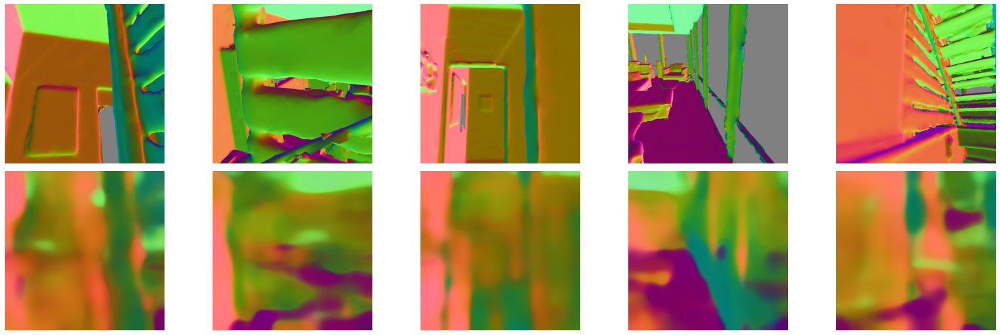

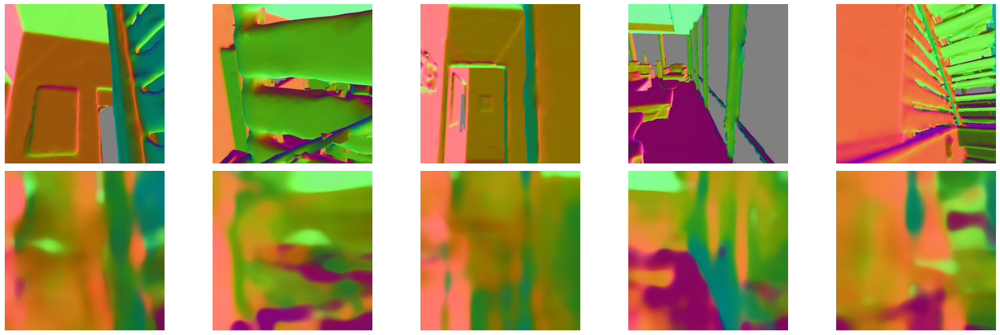

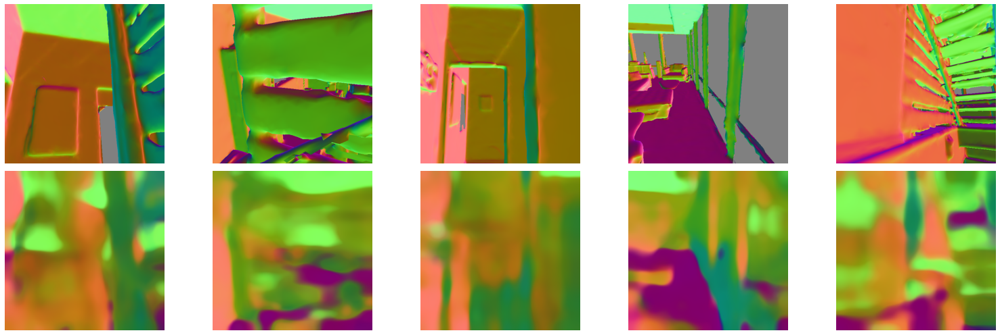

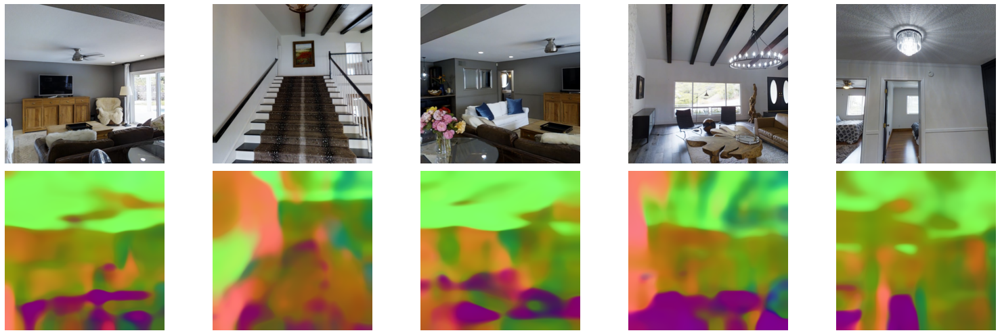

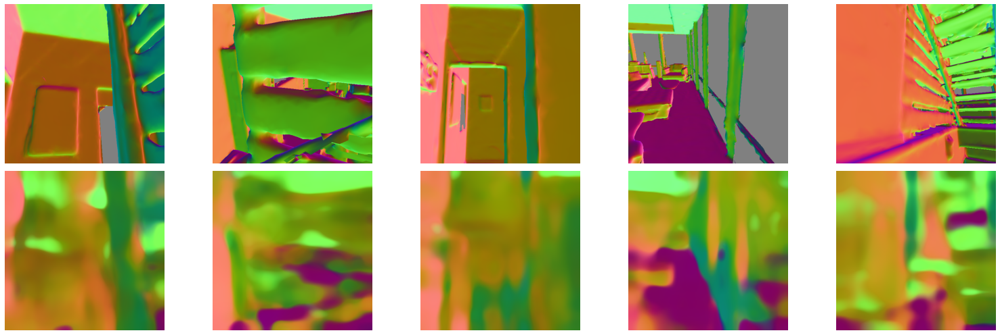

...

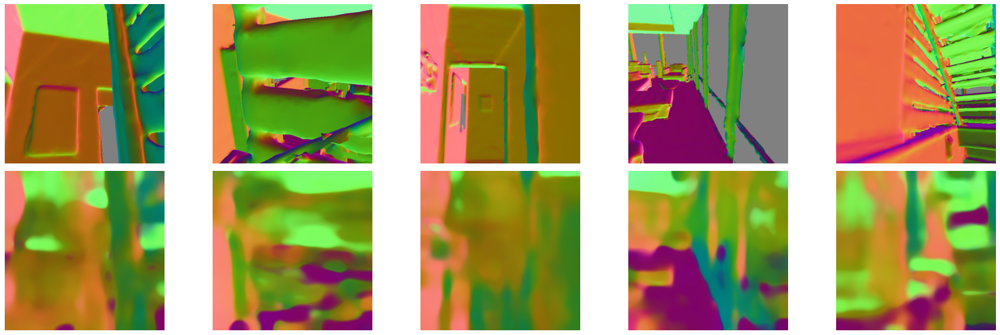

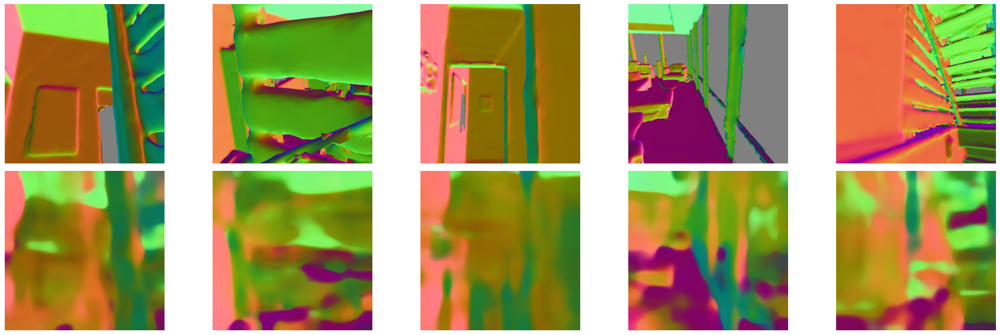

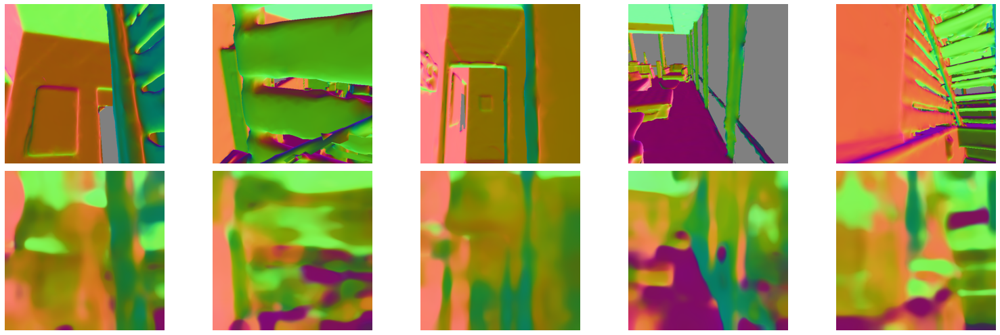

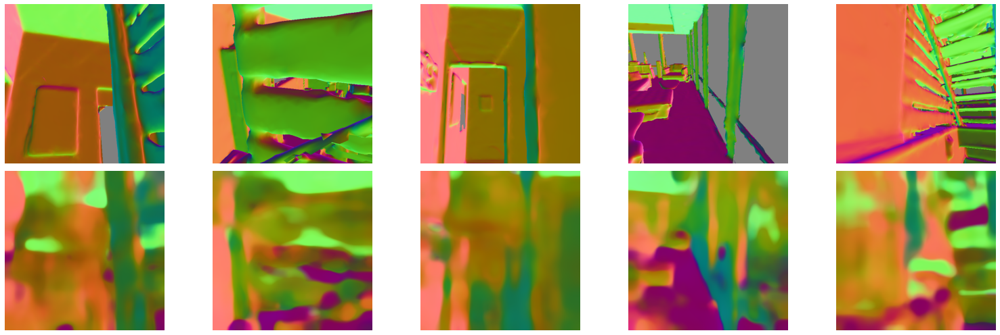

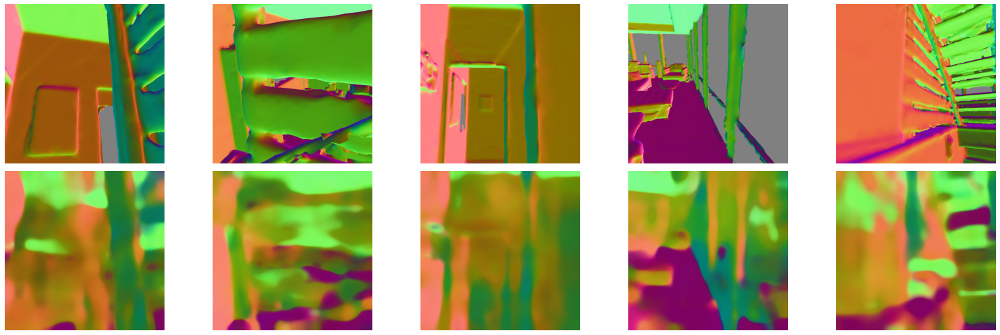

In [22]:
########################################################################
# TODO: Implement your training cycles, make sure you evaluate on validation 
# dataset and compute evaluation metrics every so often. 
# You may also want to save models that perform well.
import torch.optim as optim
model = MyModel().cuda() #to(device)
criterion = MyCriterion().cuda() #.to(device)
optimizer = optim.SGD(model.parameters(), lr=0.005, momentum=0.9, weight_decay=0.0)

train_dataset = NormalDataset(split='train')
train_dataloader = data.DataLoader(train_dataset, batch_size=8, 
                                    shuffle=True, num_workers=2, 
                                    drop_last=True)

num_epochs = 130
IS_GPU = True

# model = model.cuda()
min_avg = 35
for epoch in range(num_epochs):
    simple_train(model, criterion, optimizer, train_dataloader, epoch)
    # consider reducing learning rate
    if epoch > 10 and epoch % 10 == 0:
      updated = False
      val_gts, val_preds, val_losses, val_total_normal_errors = simple_predict('val', model)
      print("Validation loss (L1):", np.mean(val_losses))
      print("Validation metrics: Mean %.1f, Median %.1f, 11.25deg %.1f, 22.5deg %.1f, 30deg %.1f" % (
          np.average(val_total_normal_errors), np.median(val_total_normal_errors),
          np.sum(val_total_normal_errors < 11.25) / val_total_normal_errors.shape[0] * 100,
          np.sum(val_total_normal_errors < 22.5) / val_total_normal_errors.shape[0] * 100,
          np.sum(val_total_normal_errors < 30) / val_total_normal_errors.shape[0] * 100
      ))

      # vis validation
      fig, axs = plt.subplots(ncols=5, nrows=2, figsize=(22, 7))
      for idx, ax_i in enumerate(axs.T):
          ax = ax_i[0]
          ax.imshow(val_gts[idx])
          ax.axis('off')
          ax = ax_i[1]
          ax.imshow(val_preds[idx])
          ax.axis('off')
      fig.tight_layout()
      plt.savefig('vis_valset.pdf', format='pdf', bbox_inches='tight')
      #check if updated 
      if  np.average(val_total_normal_errors) < min_avg:
             min_avg = np.average(val_total_normal_errors)
             updated = True

      if updated:
        print("updated with min_abg = ", min_avg)
        #visual
        imgs, preds = simple_vis(model)
        fig, axs = plt.subplots(ncols=5, nrows=2, figsize=(22, 7))
        for idx, ax_i in enumerate(axs.T):

            ax = ax_i[0]
            ax.imshow(imgs[idx])
            ax.axis('off')
            ax = ax_i[1]
            ax.imshow(preds[idx])
            ax.axis('off')
        fig.tight_layout()
        plt.savefig('q2_visualization.pdf', format='pdf', bbox_inches='tight')
        #200 pictures

        out_dir = "Q2_normal_predictions"
        os.makedirs(out_dir, exist_ok=True)
        simple_test(model, out_dir)

print("final min_avg is" , min_avg)


# You do not need to change anything below

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:3458: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsample for details.".format(mode)



Validation loss (L1): 0.24878204639396098


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Validation metrics: Mean 34.8, Median 25.4, 11.25deg 26.1, 22.5deg 46.2, 30deg 55.3


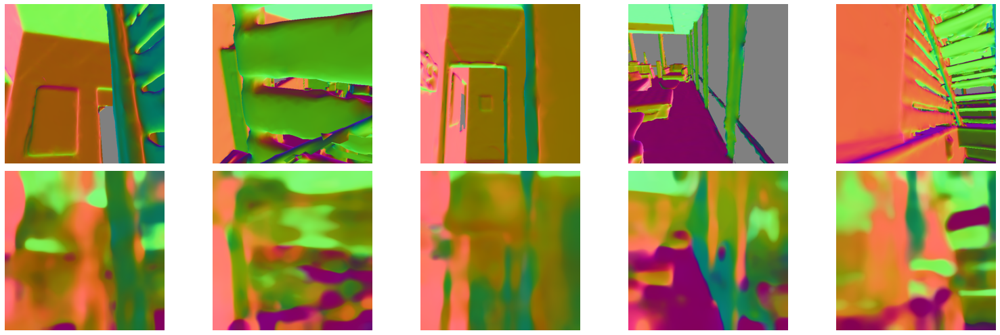

In [23]:
########################################################################
# Evaluate your result, and report
# 1. Mean angular error
# 2. Median angular error
# 3. Accuracy at 11.25 degree
# 4. Accuracy at 22.5 degree
# 5. Accuracy at 30 degree
# using provided `simple_predict` function.

def angle_error(prediction, target):
    prediction_error = torch.cosine_similarity(prediction, target)
    prediction_error = torch.clamp(prediction_error, min=-1.0, max=1.0)
    prediction_error = torch.acos(prediction_error) * 180.0 / np.pi
    return prediction_error

def simple_predict(split, model):
    model.eval()
    dataset = NormalDataset(split=split)
    dataloader = data.DataLoader(dataset, batch_size=1, shuffle=False, 
                                 num_workers=2, drop_last=False)
    gts, preds, losses = [], [], []
    total_normal_errors = None
    with torch.no_grad():
        for i, batch in enumerate(tqdm(dataloader)):
            img, gt, mask = batch
            img = img.to(device)
            gt = gt.to(device)
            mask = mask.to(device)

            pred = model(img)
            loss = (F.l1_loss(pred, gt, reduction="none") * mask).mean()

            gts.append((gt[0].permute((1, 2, 0)).cpu().numpy() + 1) / 2)
            preds.append((pred[0].permute((1, 2, 0)).cpu().numpy() + 1) / 2)
            losses.append(loss.item())

            angle_error_prediction = angle_error(pred, gt)
            angle_error_prediction = angle_error_prediction[mask > 0].view(-1)
            if total_normal_errors is None:
                total_normal_errors = angle_error_prediction.cpu().numpy()
            else:
                total_normal_errors = np.concatenate(
                    (total_normal_errors, angle_error_prediction.cpu().numpy())
                )

    return gts, preds, losses, total_normal_errors

val_gts, val_preds, val_losses, val_total_normal_errors = simple_predict('val', model)
print("Validation loss (L1):", np.mean(val_losses))
print("Validation metrics: Mean %.1f, Median %.1f, 11.25deg %.1f, 22.5deg %.1f, 30deg %.1f" % (
    np.average(val_total_normal_errors), np.median(val_total_normal_errors),
    np.sum(val_total_normal_errors < 11.25) / val_total_normal_errors.shape[0] * 100,
    np.sum(val_total_normal_errors < 22.5) / val_total_normal_errors.shape[0] * 100,
    np.sum(val_total_normal_errors < 30) / val_total_normal_errors.shape[0] * 100
))

# vis validation
fig, axs = plt.subplots(ncols=5, nrows=2, figsize=(22, 7))
for idx, ax_i in enumerate(axs.T):
    ax = ax_i[0]
    ax.imshow(val_gts[idx])
    ax.axis('off')
    ax = ax_i[1]
    ax.imshow(val_preds[idx])
    ax.axis('off')
fig.tight_layout()
plt.savefig('vis_valset.pdf', format='pdf', bbox_inches='tight')

In [ ]:
# # Visualization
# # pick some of your favorite images and put them under `./data/normal_visualization/image`

# class VisualizationDataset(data.Dataset):
#     def __init__(self, image_dir="./data/normal_visualization/image", image_ext=".png"):
#         self.img_dir = image_dir
#         self.img_ext = image_ext
        
#         self.image_filenames = [
#             os.path.splitext(os.path.basename(l))[0] for l in glob.glob(self.img_dir + "/*" + image_ext)
#         ]

#     def __len__(self):
#         return len(self.image_filenames)

#     def __getitem__(self, index):
#         filename = self.image_filenames[index]
#         img = Image.open(os.path.join(self.img_dir, filename) + self.img_ext)
#         img = np.asarray(img).copy()
#         img = ToTensor()(img)
#         img = Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])(img)
        
#         return img.contiguous(), filename

# def simple_vis(model):
#     model.eval()
#     dataset = VisualizationDataset(image_dir="./data/normal_visualization/images")
#     dataloader = data.DataLoader(dataset, batch_size=1, shuffle=False, 
#                                  num_workers=2, drop_last=False)
#     imgs, preds = [], []

#     mean = np.array([0.485, 0.456, 0.406])
#     std = np.array([0.229, 0.224, 0.225])

#     with torch.no_grad():
#         for i, batch in enumerate(tqdm(dataloader)):
#             img, _ = batch
#             img = img.to(device)

#             pred = model(img)
#             imgs.append(
#                 std * img[0].permute((1, 2, 0)).cpu().numpy() + mean
#             )
#             preds.append((pred[0].permute((1, 2, 0)).cpu().numpy() + 1) / 2)

#     return imgs, preds

# imgs, preds = simple_vis(model)
# fig, axs = plt.subplots(ncols=5, nrows=2, figsize=(22, 7))
# for idx, ax_i in enumerate(axs.T):
#     ax = ax_i[0]
#     ax.imshow(imgs[idx])
#     ax.axis('off')
#     ax = ax_i[1]
#     ax.imshow(preds[idx])
#     ax.axis('off')
# fig.tight_layout()
# plt.savefig('q2_visualization.pdf', format='pdf', bbox_inches='tight')

In [ ]:
# # Test your model on the test set, submit the output to gradescope

# from PIL import Image

# def simple_test(model, out_dir):
#     model.eval()
#     dataset = VisualizationDataset(image_dir="./data/Q2_test_data")
#     dataloader = data.DataLoader(dataset, batch_size=1, shuffle=False, 
#                                  num_workers=2, drop_last=False)

#     with torch.no_grad():
#         for i, batch in enumerate(tqdm(dataloader)):
#             img, filename = batch
#             img = img.to(device)

#             pred = model(img)
#             pred = ((pred[0].permute((1, 2, 0)).cpu().numpy() + 1) / 2) * 255
#             pred = pred.astype(np.uint8)

#             output = os.path.join(out_dir, filename[0] + ".png")

#             Image.fromarray(pred).save(output)

# out_dir = "Q2_normal_predictions"
# os.makedirs(out_dir, exist_ok=True)
# simple_test(model, out_dir)